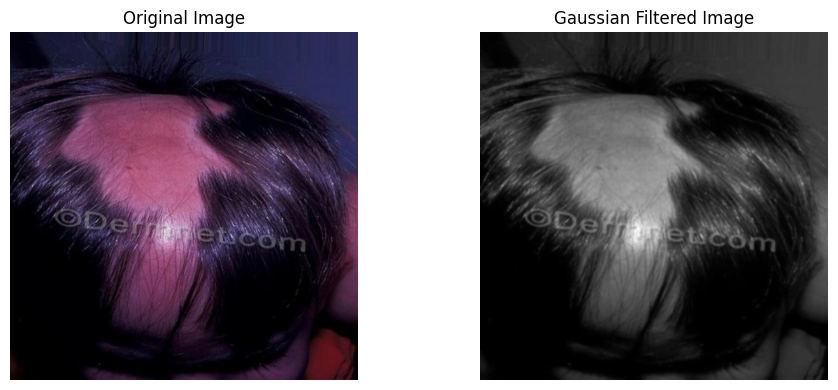

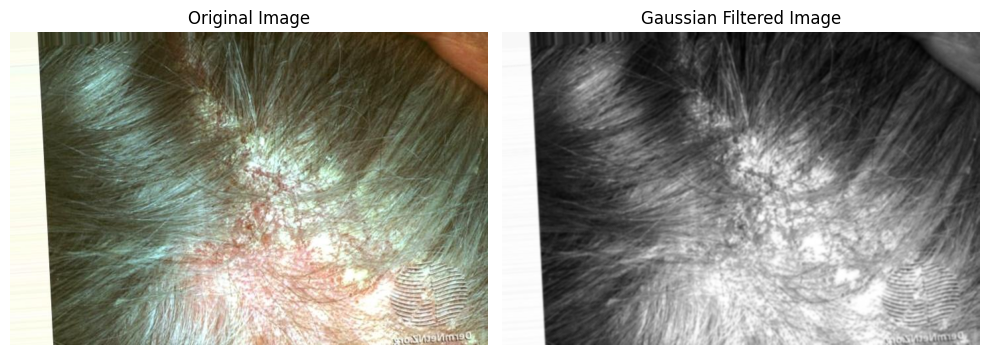

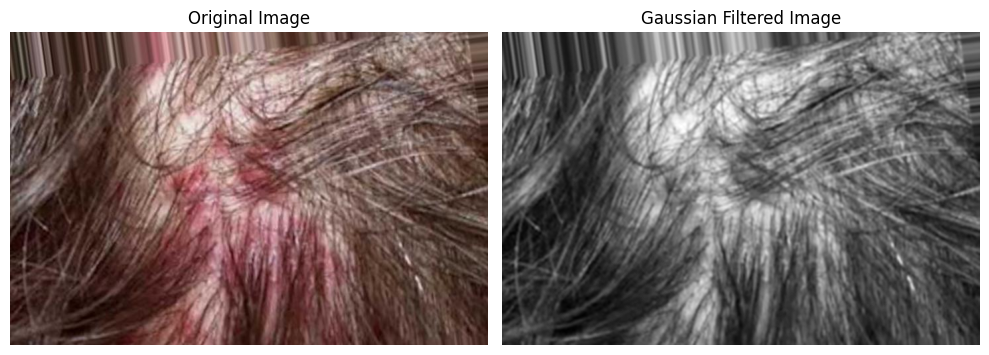

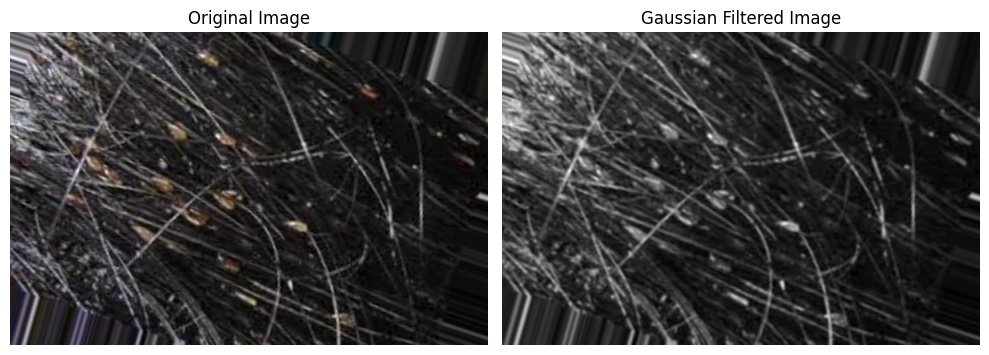

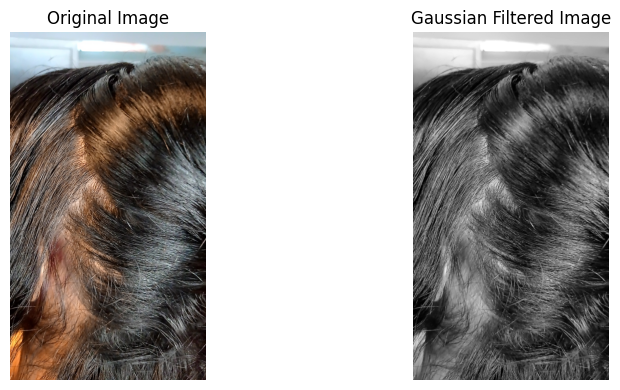

...

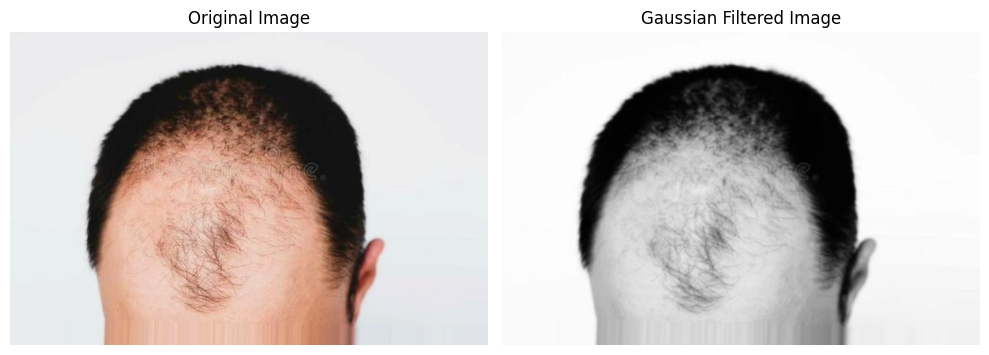

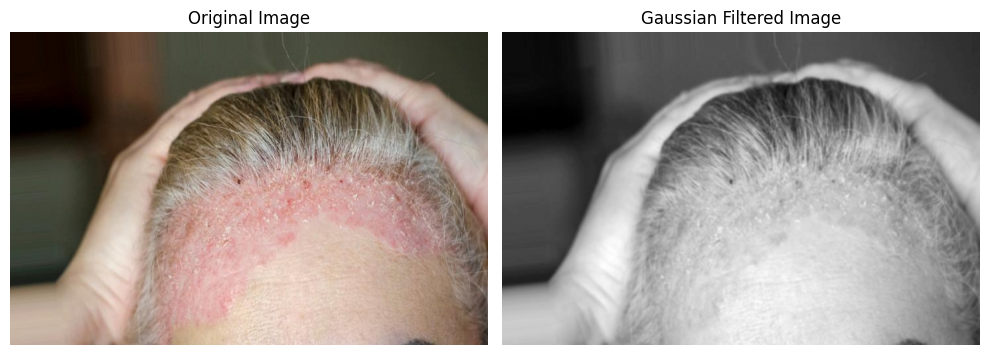

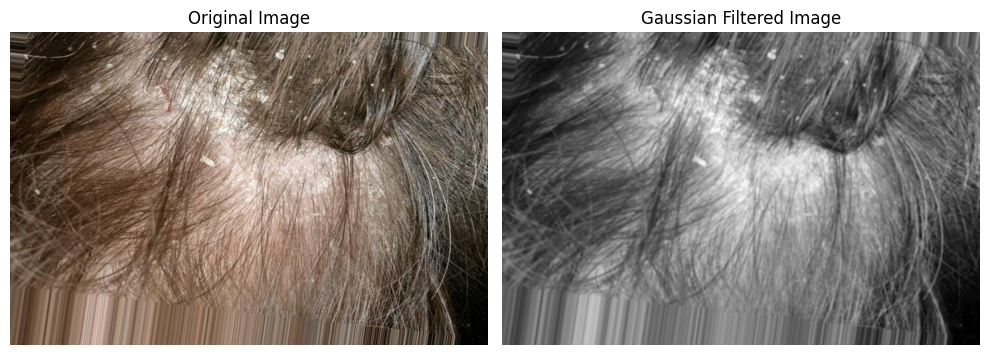

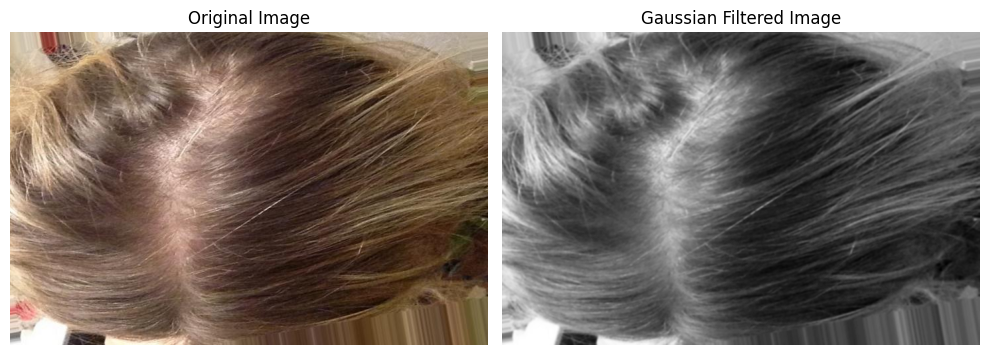

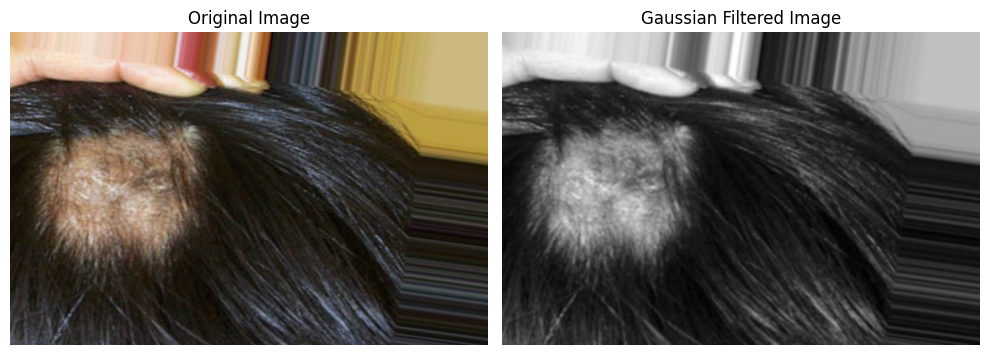

In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

def apply_gaussian_filter(image, plot=False):
    """
    Apply Gaussian filter to the image for denoising and feature extraction.
    Parameters:
    - image: Input image.
    - plot: Whether to plot the filtered image or not.
    """
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian filter for denoising
    gaussian_image = cv2.GaussianBlur(gray_image, (5, 5), 0)  # 5x5 kernel, standard deviation 0

    if plot:
        # Plot the original and filtered images
        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(gaussian_image, cmap='gray')
        plt.title('Gaussian Filtered Image')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    return gaussian_image

def process_images_for_diseases(base_folder, output_folder):
    """
    Process images for different hair diseases and perform denoising and feature extraction.
    """
    # Ensure the output folder exists
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for subfolder in ["train", "test", "val"]:
        subfolder_path = os.path.join(base_folder, subfolder)
        output_subfolder_path = os.path.join(output_folder, subfolder)

        # Loop through each disease category (class folder)
        for disease_folder in os.listdir(subfolder_path):
            disease_folder_path = os.path.join(subfolder_path, disease_folder)
            output_disease_folder_path = os.path.join(output_subfolder_path, disease_folder)

            # Process images in each disease class
            process_images_in_disease_folder(disease_folder_path, output_disease_folder_path)

def process_images_in_disease_folder(disease_folder, output_folder):
    """
    Process images in a single disease folder and save filtered images.
    """
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    processed = False  # Flag to plot only the first image per disease

    for root, dirs, files in os.walk(disease_folder):
        for filename in files:
            image_path = os.path.join(root, filename)

            # Read the image
            image = cv2.imread(image_path, cv2.IMREAD_COLOR)

            # Check if the image was successfully read
            if image is None:
                print(f"Error reading image: {image_path}")
                continue

            # Plot only the first image per disease for visualization
            plot_image = not processed

            # Apply Gaussian filter for denoising and feature extraction
            gaussian_image = apply_gaussian_filter(image, plot=plot_image)

            # Save the processed image
            output_path = os.path.join(output_folder, f"gaussian_{filename}")
            cv2.imwrite(output_path, gaussian_image)

            processed = True  # Set the flag to true after plotting the first image

if __name__ == "__main__":
    base_folder_path = r'E:\Project\hair diseases detection\Classes'
    output_folder_path = r'E:\Project\hair diseases detection\gaussian_images'

    # Process all images for hair diseases in the dataset
    process_images_for_diseases(base_folder_path, output_folder_path)
